<a href="https://colab.research.google.com/github/raghusbhat/Code-Mentor/blob/main/Florence2_v2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install -q transformers flash_attn timm einops peft

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 25.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.5/47.5 kB 2.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 56.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.2/43.2 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.4/296.4 kB 12.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 15.9 MB/s eta 0:00:00


In [ ]:
import requests
import torch
from PIL import Image, ImageDraw, ImageFont
from transformers import AutoProcessor, AutoModelForCausalLM
from io import BytesIO
from IPython.display import display

# Define device

In [ ]:
device = "cuda:0" if torch.cuda.is_available() else "cpu"
torch_dtype = torch.float16 if torch.cuda.is_available() else torch.float32
device

'cuda:0'

# Load model and processor

In [ ]:
# ! There are other models in huggingface. Ex: microsoft/Florence-2-large-ft

model = AutoModelForCausalLM.from_pretrained("microsoft/Florence-2-base", torch_dtype=torch_dtype, trust_remote_code=True).to(device)
processor = AutoProcessor.from_pretrained("microsoft/Florence-2-base", trust_remote_code=True)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/2.43k [00:00<?, ?B/s]

configuration_florence2.py:   0%|          | 0.00/15.1k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- configuration_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


modeling_florence2.py:   0%|          | 0.00/127k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- modeling_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


pytorch_model.bin:   0%|          | 0.00/464M [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

processing_florence2.py:   0%|          | 0.00/46.4k [00:00<?, ?B/s]

A new version of the following files was downloaded from https://huggingface.co/microsoft/Florence-2-base:
- processing_florence2.py
. Make sure to double-check they do not contain any added malicious code. To avoid downloading new versions of the code file, you can pin a revision.


tokenizer_config.json:   0%|          | 0.00/34.0 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.10M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

# Load image

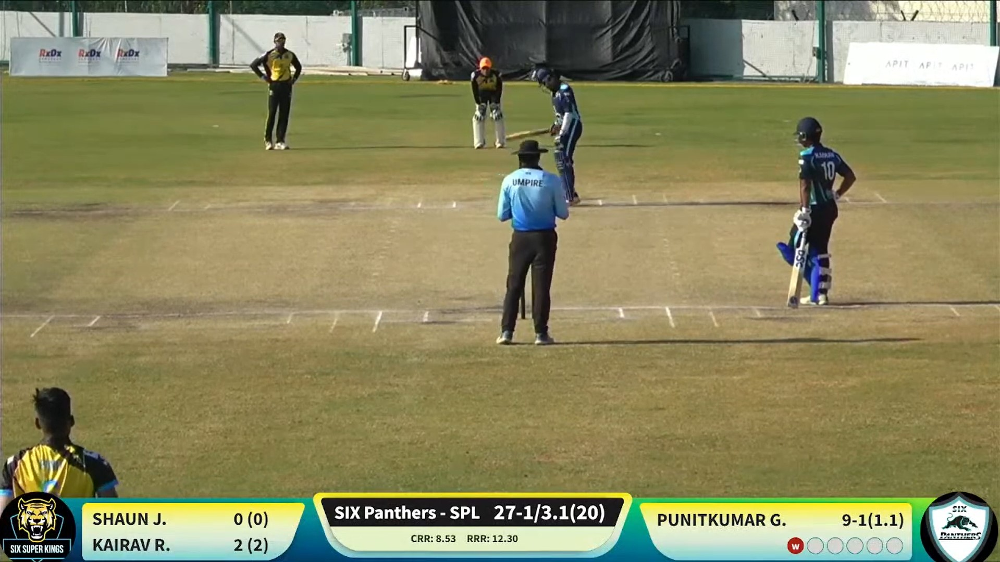

In [ ]:
# url = "https://cdn.britannica.com/63/211663-050-A674D74C/Jonny-Bairstow-batting-semifinal-match-England-Australia-2019.jpg"
# url ='https://lh6.googleusercontent.com/proxy/VfneX9wluFSra6CANzfGR-OW67D1PR5itDWIt86riKGLjlWJo7PjC5Ko339MHN7fWNsp49hYs1Xf2x-oa6jG6kN4JiA1T51A61JE'
# response = requests.get(url)
# image = Image.open(BytesIO(response.content))
image = Image.open('Screenshot_1.jpg')
image

# Inference Function

In [ ]:
def run_model(task_prompt, text_input=None):
    if text_input is None:
        print("no text_input")
        prompt = task_prompt
    else:
        print("Text Input: ", text_input)
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt").to(device, torch_dtype)
    generated_ids = model.generate(
      input_ids=inputs["input_ids"],
      pixel_values=inputs["pixel_values"],
      max_new_tokens=1024,
      num_beams=3
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

    parsed_answer = processor.post_process_generation(generated_text, task=task_prompt, image_size=(image.width, image.height))

    return parsed_answer

In [ ]:
def draw_boxes(image, result, task_type):
    draw = ImageDraw.Draw(image, "RGBA")
    if task_type == "<OCR_WITH_REGION>":
        for box, label in zip(result[task_type]['quad_boxes'], result[task_type]['labels']):
            # Convert the quad box into a bounding box
            bbox = [box[0], box[1], box[4], box[5]]
            draw.rectangle(bbox, fill=(255, 20, 147, 128), outline=(0, 255, 68, 255))
    else:
        for box, label in zip(result[task_type]['bboxes'], result[task_type]['labels']):
            bbox = [box[0], box[1], box[2], box[3]]
            draw.rectangle(bbox, fill=(249, 87, 255, 128), outline=(247, 0, 255, 255))
    return image

In [ ]:
# CAPTIONS
prompt = "<CAPTION>"
run_model(prompt)

no text_input


{'<CAPTION>': 'A group of men playing a game of cricket.'}

In [ ]:
# CAPTIONS
prompt = "<DETAILED_CAPTION>"
run_model(prompt)

no text_input


{'<DETAILED_CAPTION>': 'The image shows a group of men playing a game of cricket on a field, with one of them holding a bat and wearing a helmet. In the background, there are banners, fencing, and trees, and at the bottom of the image there is text and logos, indicating that this is a match between Pakistan and Sri Lanka in the ICC Cricket World Cup 2019.'}

In [ ]:
# CAPTIONS
prompt = "<MORE_DETAILED_CAPTION>"
run_model(prompt)

no text_input


{'<MORE_DETAILED_CAPTION>': 'The image is a screenshot from a cricket match between six Panthers and Punitkumar G. The match is being played on a grassy field with a fence in the background. The players are wearing blue and yellow jerseys and are in the middle of a play.\n\nIn the center of the image, there is a umpire wearing a blue uniform and a cap, standing behind the stumps. He is holding a bat and appears to be directing the players. On the left side of the screen, there are two players, one wearing a yellow jersey and the other wearing a black jersey. The umpire is standing in front of the umpire and is looking at the players with a concerned expression on his face. The score of the match is 0-0 in favor of the six Panthers, with the score being 27-1-1 (120).\n\nAt the bottom of the screenshot, the score is displayed in black text and the logo of the Indian Premier League (IPL) is visible in the bottom right corner.'}

no text_input
ocr_result:  {'<OCR_WITH_REGION>': {'quad_boxes': [[1697.35546875, 111.67649841308594, 1871.9844970703125, 119.22949981689453, 1871.9844970703125, 139.73049926757812, 1697.35546875, 132.17750549316406], [1572.6204833984375, 309.13348388671875, 1603.3245849609375, 309.13348388671875, 1603.3245849609375, 344.7405090332031, 1572.6204833984375, 344.7405090332031], [981.5685424804688, 341.5035095214844, 1044.8955078125, 341.5035095214844, 1044.8955078125, 359.84649658203125, 981.5685424804688, 359.84649658203125], [173.6695098876953, 982.4295043945312, 321.4324951171875, 982.4295043945312, 321.4324951171875, 1011.5625, 173.6695098876953, 1011.5625], [444.2485046386719, 982.4295043945312, 515.2515258789062, 982.4295043945312, 515.2515258789062, 1014.7994995117188, 444.2485046386719, 1014.7994995117188], [638.0675048828125, 966.2445068359375, 1160.0355224609375, 966.2445068359375, 1160.0355224609375, 1007.2465209960938, 638.0675048828125, 1006.16748046875], [1259.823486328125, 9

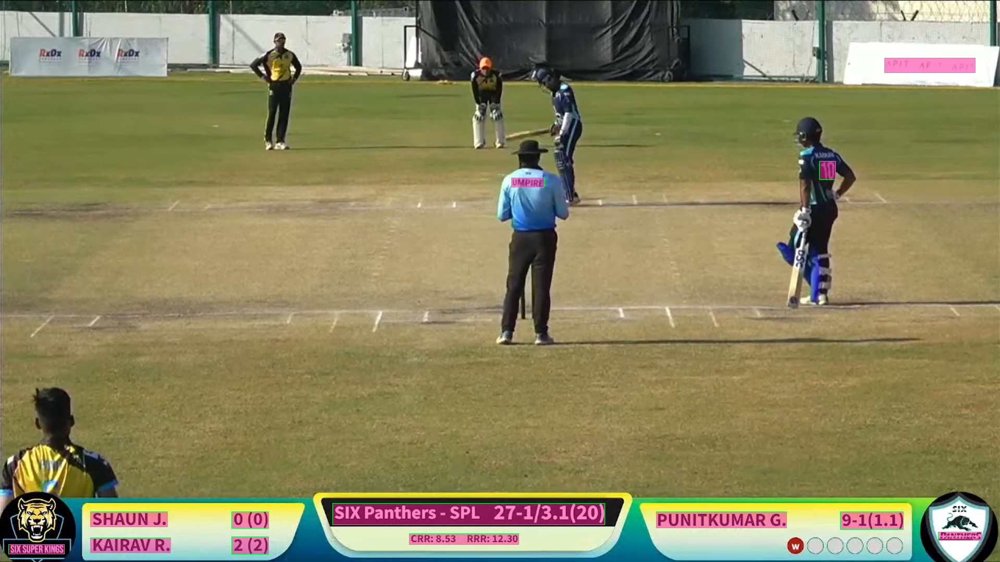

In [ ]:
# Run the OCR task
prompt = "<OCR_WITH_REGION>"
ocr_result = run_model(prompt)
print("ocr_result: ", ocr_result)
# Print labels
for label in ocr_result['<OCR_WITH_REGION>']['labels']:
    print("LABELS:")
    print(label)
annotated_image = draw_boxes(image.copy(), ocr_result, task_type=prompt)
display(annotated_image)

Text Input:  Locate the bat
caption_result:  {'<CAPTION_TO_PHRASE_GROUNDING>': {'bboxes': [[948.9454956054688, 263.81549072265625, 1102.465576171875, 666.282470703125]], 'labels': ['L']}}


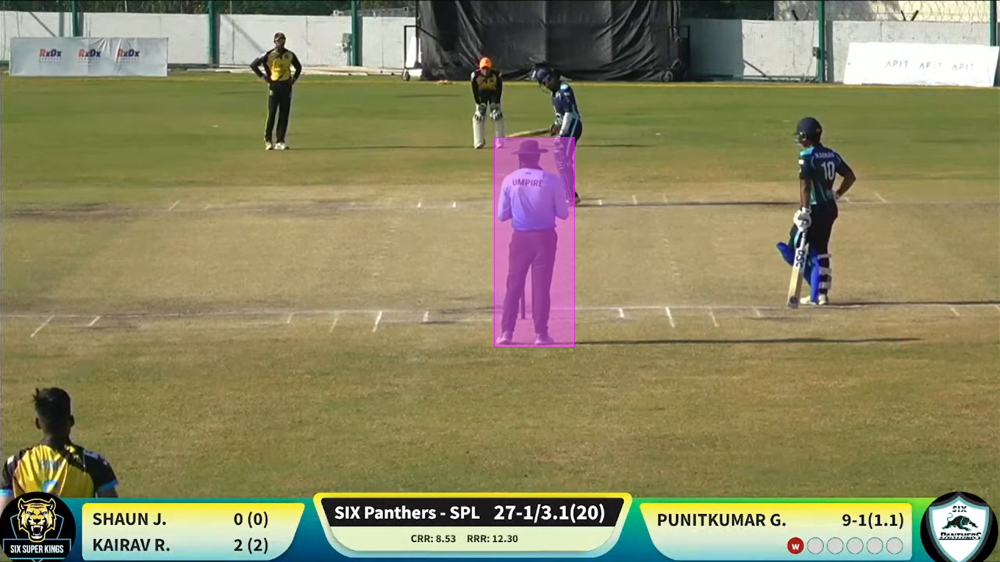

In [ ]:
# Caption to Phrase Grounding
caption = "Locate the bat"
prompt = "<CAPTION_TO_PHRASE_GROUNDING>"
caption_result = run_model(prompt, text_input=caption)
print("caption_result: ", caption_result)
annotated_image = draw_boxes(image.copy(), caption_result, task_type=prompt)
display(annotated_image)

no text_input
od_result: {'<OD>': {'bboxes': [[0.9595000147819519, 741.8125, 236.9965057373047, 1077.3814697265625], [945.1075439453125, 267.052490234375, 1108.2225341796875, 663.0454711914062], [0.9595000147819519, 741.8125, 235.07749938964844, 961.928466796875], [1513.1314697265625, 222.81349182128906, 1651.299560546875, 587.5155029296875], [1019.948486328125, 128.9405059814453, 1125.4935302734375, 391.13751220703125], [476.87152099609375, 60.9635009765625, 588.1735229492188, 288.63250732421875], [899.051513671875, 108.43949890136719, 979.6495361328125, 286.4744873046875]], 'labels': ['person', 'person', 'person', 'person', 'person', 'person', 'person']}}
LABELS:
person
LABELS:
person
LABELS:
person
LABELS:
person
LABELS:
person
LABELS:
person
LABELS:
person


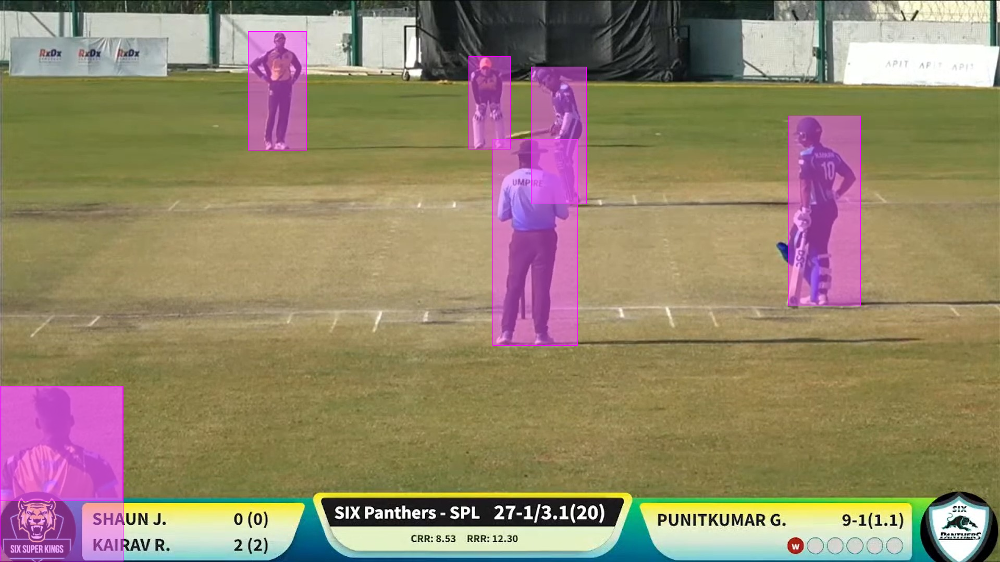

In [ ]:
# Object Detection
prompt = "<OD>"
od_result = run_model(prompt)
print("od_result:", od_result)
# Print labels
for label in od_result['<OD>']['labels']:
    print("LABELS:")
    print(label)
annotated_image = draw_boxes(image.copy(), od_result, task_type=prompt)
display(annotated_image)

no text_input
LABELS:
Shaun J. Kairav cricket player
LABELS:
Umpire on cricket field
LABELS:
Jasprit Bumrah batting during cricket match
LABELS:
cricket player in yellow and black uniform on field
LABELS:
CCTV footage of cricket player on field
LABELS:
CCTV image of man in black and yellow uniform on grass field
od_result: {'<DENSE_REGION_CAPTION>': {'bboxes': [[0.9595000147819519, 741.8125, 236.9965057373047, 1077.3814697265625], [945.1075439453125, 267.052490234375, 1108.2225341796875, 663.0454711914062], [1501.6175537109375, 222.81349182128906, 1651.299560546875, 587.5155029296875], [476.87152099609375, 60.9635009765625, 588.1735229492188, 288.63250732421875], [1021.8674926757812, 128.9405059814453, 1125.4935302734375, 391.13751220703125], [899.051513671875, 108.43949890136719, 979.6495361328125, 286.4744873046875]], 'labels': ['Shaun J. Kairav cricket player', 'Umpire on cricket field', 'Jasprit Bumrah batting during cricket match', 'cricket player in yellow and black uniform on fi

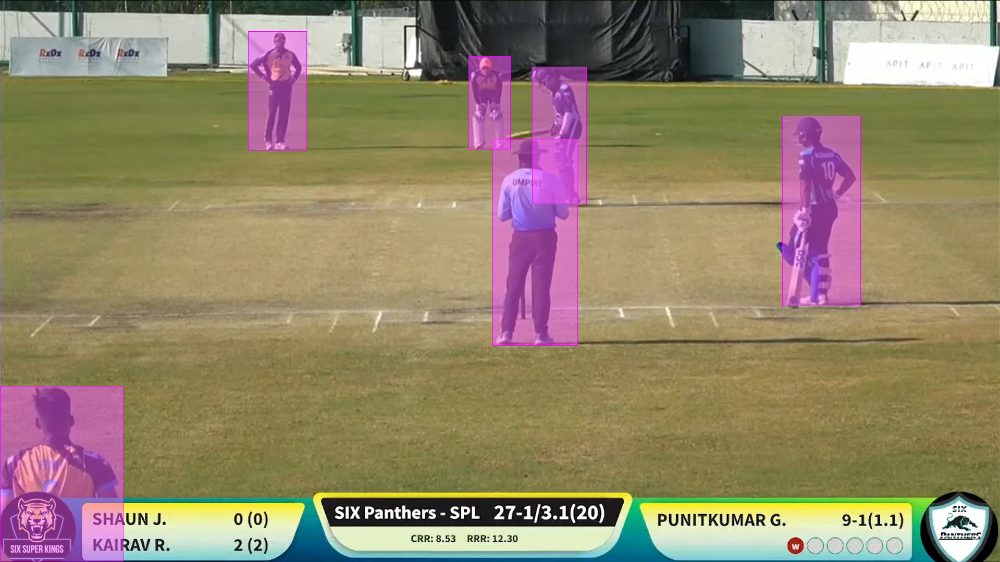

In [ ]:
# Dense Region Caption
prompt = "<DENSE_REGION_CAPTION>"
od_result = run_model(prompt)
for label in od_result['<DENSE_REGION_CAPTION>']['labels']:
    print("LABELS:")
    print(label)
print("od_result:", od_result)
annotated_image = draw_boxes(image.copy(), od_result, task_type=prompt)
display(annotated_image)

no text_input
od_result: {'<REGION_PROPOSAL>': {'bboxes': [[0.9595000147819519, 741.8125, 236.9965057373047, 1077.3814697265625], [945.1075439453125, 267.052490234375, 1108.2225341796875, 663.0454711914062], [0.9595000147819519, 741.8125, 235.07749938964844, 963.0075073242188], [1513.1314697265625, 222.81349182128906, 1651.299560546875, 586.4365234375], [1019.948486328125, 128.9405059814453, 1125.4935302734375, 391.13751220703125], [476.87152099609375, 60.9635009765625, 588.1735229492188, 288.63250732421875], [899.051513671875, 108.43949890136719, 979.6495361328125, 286.4744873046875]], 'labels': ['', '', '', '', '', '', '']}}


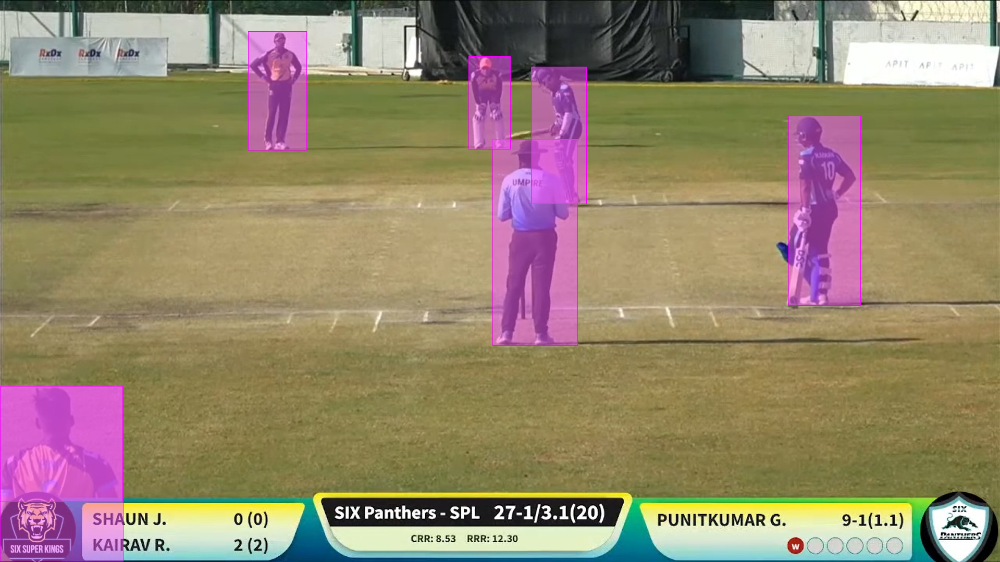

In [ ]:
# Region proposal
prompt = "<REGION_PROPOSAL>"
od_result = run_model(prompt)
print("od_result:", od_result)
annotated_image = draw_boxes(image.copy(), od_result, task_type=prompt)
display(annotated_image)